<a href="https://colab.research.google.com/github/dongchen-123/Deep-Learning-PCB-Defect-Detection-with-YOLO/blob/main/pcb_defects_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import os

In [ ]:
if torch.cuda.is_available():
    print("cuda is available")

cuda is available


In [ ]:
!file yolo_dataset.zip

yolo_dataset.zip: Zip archive data, at least v2.0 to extract, compression method=store


In [ ]:
import zipfile

with zipfile.ZipFile("yolo_dataset.zip", 'r') as zip_ref:
    zip_ref.extractall(".")

In [ ]:
import zipfile

with zipfile.ZipFile("yolo_test_dataset.zip", 'r') as zip_ref:
    zip_ref.extractall("yolo_test_dataset")

In [3]:
import ultralytics
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model=YOLO('yolo11s.pt')

In [ ]:
os.environ['WANDB_MODE'] = 'disabled'
results=model.train(data="/content/yolo_dataset/data.yaml",epochs=200)

Ultralytics 8.3.174 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretr

train: Scanning /content/yolo_dataset/labels/train... 485 images, 0 backgrounds, 0 corrupt: 100%|██████████| 485/485 [00:00<00:00, 1534.42it/s]

train: New cache created: /content/yolo_dataset/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2109.5±1381.2 MB/s, size: 162.8 KB)


val: Scanning /content/yolo_dataset/labels/val... 138 images, 0 backgrounds, 0 corrupt: 100%|██████████| 138/138 [00:00<00:00, 2026.59it/s]

val: New cache created: /content/yolo_dataset/labels/val.cache


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      4.05G      3.678      13.45      1.807         33        640: 100%|██████████| 31/31 [00:12<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.25it/s]

                   all        138        597      0.586     0.0195     0.0222     0.0107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      4.84G      2.653      3.839      1.216         26        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.21it/s]

                   all        138        597      0.337      0.362      0.284      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      4.87G      2.443      2.527       1.14         21        640: 100%|██████████| 31/31 [00:09<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.89it/s]

                   all        138        597      0.482      0.425      0.415      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      4.92G      2.255      2.084      1.076         23        640: 100%|██████████| 31/31 [00:09<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.47it/s]

                   all        138        597      0.681      0.587       0.64      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      4.96G      2.183       1.73       1.06         22        640: 100%|██████████| 31/31 [00:09<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.80it/s]


                   all        138        597      0.727        0.6      0.653      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200         5G      2.135      1.591      1.065         33        640: 100%|██████████| 31/31 [00:09<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

                   all        138        597      0.829      0.583      0.684      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      5.03G      2.072       1.48      1.038         41        640: 100%|██████████| 31/31 [00:09<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.73it/s]

                   all        138        597      0.764      0.686      0.768      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      5.08G      2.024      1.369      1.026         16        640: 100%|██████████| 31/31 [00:09<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597      0.816      0.788      0.832      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      5.12G      2.017      1.317       1.02         30        640: 100%|██████████| 31/31 [00:09<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.80it/s]

                   all        138        597      0.866      0.795       0.85      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      5.16G      1.989      1.293      1.018         18        640: 100%|██████████| 31/31 [00:10<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.79it/s]

                   all        138        597      0.817      0.728      0.798      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      5.19G      1.966      1.265      1.016         18        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.75it/s]

                   all        138        597      0.747      0.709      0.752      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      5.24G      1.943      1.183     0.9992         23        640: 100%|██████████| 31/31 [00:10<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.78it/s]

                   all        138        597      0.772      0.766      0.802       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      5.28G       1.92      1.131      1.009         32        640: 100%|██████████| 31/31 [00:10<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.72it/s]

                   all        138        597      0.885      0.797      0.849      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      5.32G      1.966      1.196     0.9953         34        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.69it/s]

                   all        138        597      0.904      0.779      0.853      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      5.34G      1.911      1.169      0.993         27        640: 100%|██████████| 31/31 [00:09<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]

                   all        138        597       0.88      0.834       0.88      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200       5.4G      1.901      1.134     0.9939         33        640: 100%|██████████| 31/31 [00:09<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]


                   all        138        597       0.93       0.82      0.881      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      5.44G      1.843      1.061     0.9904         20        640: 100%|██████████| 31/31 [00:09<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

                   all        138        597      0.752      0.781      0.786       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      5.48G      1.887      1.093     0.9911         24        640: 100%|██████████| 31/31 [00:09<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.56it/s]


                   all        138        597      0.907      0.778      0.847      0.365

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200       5.5G      1.908      1.104     0.9712         41        640: 100%|██████████| 31/31 [00:09<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597      0.894      0.839      0.874      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      5.56G      1.851      1.072     0.9787         23        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.78it/s]

                   all        138        597      0.878      0.788      0.827      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200       5.6G      1.824      1.044     0.9918         17        640: 100%|██████████| 31/31 [00:10<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.77it/s]

                   all        138        597      0.946      0.831      0.889      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      5.64G      1.777      1.017     0.9623         20        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.78it/s]

                   all        138        597      0.942      0.828      0.868      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      5.66G      1.835      1.033     0.9743         28        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.63it/s]

                   all        138        597      0.932      0.858      0.906      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      5.72G      1.846      1.019     0.9865         37        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]

                   all        138        597      0.935      0.822      0.892      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      5.76G      1.796     0.9784     0.9673         22        640: 100%|██████████| 31/31 [00:09<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.54it/s]

                   all        138        597      0.946      0.822      0.894       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200       5.8G      1.793      0.984     0.9561         14        640: 100%|██████████| 31/31 [00:10<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.66it/s]

                   all        138        597      0.939      0.878      0.916      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      5.82G       1.79      1.005     0.9692         24        640: 100%|██████████| 31/31 [00:09<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]

                   all        138        597      0.907      0.831      0.882      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      5.88G      1.769     0.9746     0.9582         25        640: 100%|██████████| 31/31 [00:09<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.70it/s]


                   all        138        597      0.879      0.891      0.922      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      5.92G      1.781     0.9801      0.961         25        640: 100%|██████████| 31/31 [00:09<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

                   all        138        597      0.941      0.875      0.916      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      5.96G      1.759     0.9873     0.9552         33        640: 100%|██████████| 31/31 [00:09<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.36it/s]


                   all        138        597       0.95      0.874      0.915      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      5.98G      1.742     0.9418      0.946         23        640: 100%|██████████| 31/31 [00:09<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.66it/s]

                   all        138        597      0.953      0.858      0.913      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      6.04G      1.746     0.9423     0.9613         38        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.69it/s]

                   all        138        597      0.879      0.856      0.878      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      6.08G      1.788     0.9699     0.9607         15        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.70it/s]

                   all        138        597      0.903      0.843      0.882      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      6.12G      1.766     0.9807     0.9491         16        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.72it/s]

                   all        138        597      0.906      0.827      0.889      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      6.14G      1.735     0.9378     0.9465         25        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.78it/s]

                   all        138        597      0.906      0.856      0.889       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200       6.2G      1.726      0.927     0.9446         39        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.79it/s]

                   all        138        597      0.932      0.886       0.93      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      6.24G      1.723     0.9329     0.9331         31        640: 100%|██████████| 31/31 [00:10<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.59it/s]

                   all        138        597      0.958      0.858      0.921      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      6.28G        1.7     0.9011     0.9381         23        640: 100%|██████████| 31/31 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.59it/s]

                   all        138        597      0.937      0.881      0.917      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200       6.3G      1.683     0.8949     0.9411         22        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.54it/s]

                   all        138        597      0.938      0.847      0.904      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      6.36G      1.657     0.8924     0.9293         27        640: 100%|██████████| 31/31 [00:09<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]

                   all        138        597      0.932      0.889      0.926      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200       6.4G      1.669     0.8953     0.9462         19        640: 100%|██████████| 31/31 [00:09<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

                   all        138        597      0.882      0.871      0.908      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      6.44G      1.676     0.8863     0.9441         22        640: 100%|██████████| 31/31 [00:09<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

                   all        138        597      0.953      0.883      0.926      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      6.46G      1.652     0.8619     0.9208         18        640: 100%|██████████| 31/31 [00:09<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]

                   all        138        597      0.869      0.856      0.914      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      6.52G      1.699     0.9081     0.9323         39        640: 100%|██████████| 31/31 [00:09<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.80it/s]

                   all        138        597      0.927      0.877      0.925      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      6.56G      1.634     0.8718     0.9233         15        640: 100%|██████████| 31/31 [00:10<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.67it/s]

                   all        138        597      0.939      0.884       0.93      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200       6.6G      1.691     0.8871     0.9335         32        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.75it/s]

                   all        138        597      0.951      0.868      0.914      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      6.62G      1.651     0.8631     0.9186         33        640: 100%|██████████| 31/31 [00:10<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597       0.93      0.885      0.919      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      6.68G      1.653     0.8476     0.9277         37        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.66it/s]

                   all        138        597      0.931      0.892      0.929      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      6.71G      1.622     0.8448     0.9271         36        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.49it/s]

                   all        138        597       0.95      0.896      0.912      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      6.75G      1.642     0.8452     0.9207         14        640: 100%|██████████| 31/31 [00:09<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.66it/s]

                   all        138        597      0.957      0.873      0.924      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      6.78G      1.608     0.8296     0.9252         27        640: 100%|██████████| 31/31 [00:09<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.42it/s]

                   all        138        597      0.941      0.887      0.922      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      6.83G      1.611     0.8012      0.924         26        640: 100%|██████████| 31/31 [00:09<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

                   all        138        597      0.971      0.888      0.941      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      6.88G      1.611     0.8326     0.9142         31        640: 100%|██████████| 31/31 [00:09<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

                   all        138        597      0.956      0.906      0.931       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      6.91G      1.603     0.8263     0.9143         44        640: 100%|██████████| 31/31 [00:09<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]

                   all        138        597      0.916      0.859      0.927      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      6.94G      1.622     0.8189     0.9324         38        640: 100%|██████████| 31/31 [00:09<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.66it/s]

                   all        138        597       0.96      0.917      0.941      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      6.99G      1.627     0.8399     0.9309         28        640: 100%|██████████| 31/31 [00:09<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.81it/s]

                   all        138        597      0.935       0.93      0.946       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      7.04G      1.611     0.8281     0.9082         14        640: 100%|██████████| 31/31 [00:10<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.63it/s]

                   all        138        597       0.93      0.907      0.937      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      7.07G      1.611     0.8196      0.921         28        640: 100%|██████████| 31/31 [00:10<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.65it/s]

                   all        138        597      0.908       0.87      0.915      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      7.09G      1.533     0.7683      0.911         21        640: 100%|██████████| 31/31 [00:10<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.72it/s]

                   all        138        597      0.935      0.913       0.93      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      7.15G      1.597     0.8215     0.9057         18        640: 100%|██████████| 31/31 [00:10<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.80it/s]

                   all        138        597      0.967      0.923      0.947      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      7.19G      1.552     0.7596      0.914         39        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.82it/s]

                   all        138        597      0.938      0.888      0.931      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      7.23G      1.545     0.7689     0.9105         14        640: 100%|██████████| 31/31 [00:10<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.62it/s]

                   all        138        597       0.95      0.915      0.942      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      4.36G      1.524     0.7764     0.9103         23        640: 100%|██████████| 31/31 [00:10<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.54it/s]

                   all        138        597      0.971      0.889      0.933      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      5.12G      1.573     0.7746     0.9176         26        640: 100%|██████████| 31/31 [00:10<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.61it/s]

                   all        138        597      0.913      0.909      0.937      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      5.12G      1.556     0.7889     0.8993         24        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]

                   all        138        597      0.958      0.888      0.929      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      5.12G      1.559     0.7853     0.9122         10        640: 100%|██████████| 31/31 [00:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

                   all        138        597      0.951      0.905      0.941      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      5.12G       1.56     0.7665        0.9         26        640: 100%|██████████| 31/31 [00:09<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

                   all        138        597      0.919      0.903      0.934      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      5.12G      1.556     0.7851     0.9076         15        640: 100%|██████████| 31/31 [00:09<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.22it/s]

                   all        138        597      0.936      0.904      0.938      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      5.13G      1.545      0.777      0.906         23        640: 100%|██████████| 31/31 [00:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.86it/s]

                   all        138        597      0.933      0.883      0.923      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      5.18G      1.487     0.7505     0.9062         19        640: 100%|██████████| 31/31 [00:10<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.58it/s]

                   all        138        597      0.952      0.898      0.929      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200       5.2G      1.526     0.7712     0.9077         29        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.79it/s]

                   all        138        597      0.929        0.9      0.919      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      5.25G      1.523     0.7525     0.8959         23        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.70it/s]

                   all        138        597       0.93      0.912      0.928      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      5.29G      1.513     0.7656     0.9022         19        640: 100%|██████████| 31/31 [00:10<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.79it/s]

                   all        138        597      0.959      0.895      0.936      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      5.33G      1.546     0.7531     0.9001         21        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.77it/s]

                   all        138        597      0.943      0.921      0.938      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      5.36G      1.513     0.7387     0.9037         17        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.79it/s]

                   all        138        597      0.963      0.924      0.941      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      5.41G      1.466     0.7002     0.8947         15        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.50it/s]

                   all        138        597      0.965      0.941      0.944      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      5.45G      1.522     0.7475     0.9005         20        640: 100%|██████████| 31/31 [00:09<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

                   all        138        597      0.958       0.91      0.942      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      5.49G      1.475     0.7182     0.8928         23        640: 100%|██████████| 31/31 [00:09<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.65it/s]


                   all        138        597       0.97      0.907      0.944      0.458

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      5.51G      1.489     0.7482     0.8982         32        640: 100%|██████████| 31/31 [00:09<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

                   all        138        597       0.96      0.934      0.951      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      5.57G      1.478     0.7351      0.887         14        640: 100%|██████████| 31/31 [00:09<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]

                   all        138        597      0.952      0.933      0.939      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      5.61G      1.451     0.7198     0.8943         41        640: 100%|██████████| 31/31 [00:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.79it/s]

                   all        138        597       0.96      0.937       0.95      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      5.65G      1.501     0.7317     0.8906         20        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.65it/s]

                   all        138        597      0.969      0.925      0.948      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      5.67G      1.484     0.7295      0.895         30        640: 100%|██████████| 31/31 [00:10<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.79it/s]

                   all        138        597      0.964      0.915       0.94      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      5.73G      1.472     0.7303      0.899         32        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.80it/s]

                   all        138        597      0.957       0.92      0.946      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      5.77G      1.502     0.7446     0.8977         18        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.72it/s]

                   all        138        597      0.948      0.924      0.943      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      5.81G      1.483     0.7277      0.892         40        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.71it/s]

                   all        138        597      0.967      0.919      0.938      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      5.83G       1.46     0.7028     0.8871         46        640: 100%|██████████| 31/31 [00:10<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.75it/s]

                   all        138        597      0.967       0.93      0.949      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      5.89G      1.409     0.6855     0.8876         32        640: 100%|██████████| 31/31 [00:10<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.48it/s]

                   all        138        597      0.968      0.924      0.939      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      5.93G      1.436     0.7005     0.8853         26        640: 100%|██████████| 31/31 [00:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

                   all        138        597      0.952      0.902      0.936      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      5.97G      1.441     0.6989     0.8788         20        640: 100%|██████████| 31/31 [00:09<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

                   all        138        597      0.952       0.94      0.955      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      5.99G      1.401     0.6913     0.8859         29        640: 100%|██████████| 31/31 [00:09<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]

                   all        138        597      0.936      0.925      0.931      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      6.05G      1.456     0.7246     0.8934         13        640: 100%|██████████| 31/31 [00:09<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597       0.97      0.911      0.939      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      6.09G      1.426     0.6999     0.8875         27        640: 100%|██████████| 31/31 [00:09<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.69it/s]

                   all        138        597      0.946      0.911      0.931      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      6.13G      1.443     0.6955     0.8883         35        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.85it/s]

                   all        138        597      0.974      0.916      0.951      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      6.15G      1.465     0.6966     0.8863         18        640: 100%|██████████| 31/31 [00:10<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597      0.968      0.912      0.945      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      6.21G      1.434     0.6926     0.8833         34        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.85it/s]

                   all        138        597      0.972      0.926      0.954      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      6.25G      1.456     0.7131     0.8863         23        640: 100%|██████████| 31/31 [00:10<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.81it/s]

                   all        138        597      0.955      0.936      0.954      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      6.29G      1.388     0.6685     0.8776         33        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.73it/s]

                   all        138        597      0.969       0.94      0.957      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      6.31G      1.407     0.6666     0.8855         29        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.68it/s]

                   all        138        597       0.94       0.93      0.946      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      6.37G       1.38     0.6741     0.8821         36        640: 100%|██████████| 31/31 [00:10<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]

                   all        138        597      0.961      0.929      0.941      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      6.41G      1.395     0.6886     0.8787         25        640: 100%|██████████| 31/31 [00:09<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

                   all        138        597      0.943      0.935      0.938      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      6.45G      1.386     0.6769     0.8787         23        640: 100%|██████████| 31/31 [00:09<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

                   all        138        597      0.971      0.917      0.948      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      6.47G      1.394      0.688     0.8742         24        640: 100%|██████████| 31/31 [00:09<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]


                   all        138        597      0.969      0.931      0.946      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      6.53G      1.415     0.7006     0.8768         18        640: 100%|██████████| 31/31 [00:09<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.87it/s]

                   all        138        597      0.971      0.934      0.947      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      6.57G       1.42     0.6983     0.8795         23        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.82it/s]

                   all        138        597      0.974      0.914      0.946      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      6.61G       1.37     0.6643     0.8752         30        640: 100%|██████████| 31/31 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597      0.976      0.941       0.96       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      6.63G      1.372     0.6549     0.8836         15        640: 100%|██████████| 31/31 [00:10<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.78it/s]

                   all        138        597       0.96       0.93      0.947      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      6.69G      1.391     0.6744     0.8708         26        640: 100%|██████████| 31/31 [00:10<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.77it/s]

                   all        138        597      0.953      0.934      0.949      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      6.73G      1.355     0.6538     0.8818         41        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.73it/s]

                   all        138        597       0.95      0.936      0.947      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      6.77G      1.353     0.6487      0.872         25        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.82it/s]

                   all        138        597      0.946      0.919      0.936      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      6.79G      1.362     0.6528     0.8715         42        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.63it/s]

                   all        138        597      0.952      0.916       0.94      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      6.85G      1.374     0.6614     0.8797         30        640: 100%|██████████| 31/31 [00:09<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]

                   all        138        597      0.975      0.914      0.944      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      6.89G      1.384      0.667     0.8692         11        640: 100%|██████████| 31/31 [00:09<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

                   all        138        597       0.96      0.933      0.954      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      6.93G      1.357     0.6526     0.8685         52        640: 100%|██████████| 31/31 [00:09<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

                   all        138        597      0.972      0.932      0.946      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      6.95G      1.352     0.6545     0.8715         27        640: 100%|██████████| 31/31 [00:09<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]

                   all        138        597      0.955      0.937      0.941      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      7.01G      1.379     0.6576     0.8662         53        640: 100%|██████████| 31/31 [00:09<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.84it/s]

                   all        138        597      0.955       0.93      0.936      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      7.04G       1.33     0.6403     0.8768         39        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.89it/s]

                   all        138        597      0.944       0.93      0.945      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      7.09G      1.365     0.6558     0.8715         21        640: 100%|██████████| 31/31 [00:10<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597      0.951      0.911      0.943      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      7.11G       1.33     0.6353     0.8704         35        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.65it/s]

                   all        138        597      0.964      0.934      0.955       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      7.16G      1.322     0.6441     0.8672         13        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.74it/s]

                   all        138        597      0.965      0.937      0.946      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200       7.2G      1.324     0.6365     0.8678         25        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.80it/s]

                   all        138        597      0.963      0.932      0.949      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      7.24G      1.302     0.6206     0.8674         35        640: 100%|██████████| 31/31 [00:10<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.82it/s]

                   all        138        597      0.967      0.933      0.948      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      7.27G      1.334     0.6417     0.8717         10        640: 100%|██████████| 31/31 [00:10<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.67it/s]

                   all        138        597      0.967      0.931      0.948      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      7.32G      1.295     0.6291     0.8611         26        640: 100%|██████████| 31/31 [00:09<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]

                   all        138        597      0.973      0.949      0.957      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      7.36G      1.329     0.6398      0.861         17        640: 100%|██████████| 31/31 [00:09<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

                   all        138        597      0.968      0.941      0.953      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200       7.4G      1.262     0.6103     0.8652         14        640: 100%|██████████| 31/31 [00:09<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

                   all        138        597      0.964      0.947      0.955      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      4.42G      1.303      0.637     0.8654         17        640: 100%|██████████| 31/31 [00:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

                   all        138        597      0.964       0.94      0.949      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      4.42G      1.294     0.6234     0.8612         19        640: 100%|██████████| 31/31 [00:09<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]

                   all        138        597      0.964      0.942       0.95      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      4.42G      1.303     0.6263     0.8701         33        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.71it/s]

                   all        138        597      0.964       0.93      0.952      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      4.42G      1.264     0.6305     0.8793         33        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.70it/s]

                   all        138        597      0.962      0.929       0.94      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      4.42G      1.298     0.6196     0.8629         35        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.71it/s]

                   all        138        597      0.965      0.946      0.959      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      4.42G       1.28     0.6324     0.8631         20        640: 100%|██████████| 31/31 [00:10<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.72it/s]

                   all        138        597      0.966      0.926      0.957      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      4.42G      1.285     0.6171     0.8495         42        640: 100%|██████████| 31/31 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.83it/s]

                   all        138        597      0.964      0.945       0.96      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      4.43G      1.273     0.6151     0.8606         16        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.85it/s]

                   all        138        597      0.961      0.942      0.952      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      4.45G      1.259     0.6147     0.8561         24        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597      0.962      0.941      0.946      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      4.51G      1.303     0.6197     0.8647         19        640: 100%|██████████| 31/31 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.44it/s]

                   all        138        597      0.966      0.936      0.947      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      4.55G       1.28     0.6194     0.8601         37        640: 100%|██████████| 31/31 [00:09<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]

                   all        138        597       0.97      0.944      0.953      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      4.59G      1.263     0.6245     0.8543         42        640: 100%|██████████| 31/31 [00:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.44it/s]

                   all        138        597      0.963      0.945      0.955      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      4.61G      1.216     0.5858     0.8536         28        640: 100%|██████████| 31/31 [00:09<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.65it/s]


                   all        138        597       0.97      0.948      0.964       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      4.67G       1.27     0.5994     0.8573         40        640: 100%|██████████| 31/31 [00:09<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]

                   all        138        597      0.968      0.946      0.957      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      4.71G      1.233     0.5998     0.8534         28        640: 100%|██████████| 31/31 [00:09<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.82it/s]

                   all        138        597      0.959      0.943      0.951       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      4.75G      1.246     0.6002     0.8508         39        640: 100%|██████████| 31/31 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.80it/s]

                   all        138        597      0.958       0.94      0.948       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      4.81G      1.251     0.5977     0.8586         37        640: 100%|██████████| 31/31 [00:10<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.65it/s]

                   all        138        597      0.963      0.935      0.948      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      4.87G      1.216     0.5773      0.858         28        640: 100%|██████████| 31/31 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.72it/s]

                   all        138        597      0.964      0.941      0.951      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      4.91G      1.218     0.5874     0.8548         21        640: 100%|██████████| 31/31 [00:10<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.78it/s]

                   all        138        597       0.96      0.932      0.944      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      4.98G      1.237     0.5915      0.852         24        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.73it/s]

                   all        138        597       0.97      0.932      0.951      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      5.04G      1.216     0.5815     0.8503         44        640: 100%|██████████| 31/31 [00:10<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.26it/s]

                   all        138        597      0.968      0.939      0.953       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200       5.1G      1.211      0.596     0.8524         36        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.74it/s]

                   all        138        597      0.954      0.944       0.95      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      5.13G      1.209     0.5804     0.8451         26        640: 100%|██████████| 31/31 [00:09<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]

                   all        138        597      0.951      0.948      0.946      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      5.21G      1.222     0.5799     0.8524         19        640: 100%|██████████| 31/31 [00:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

                   all        138        597      0.968      0.948      0.957      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      5.23G      1.224     0.5857     0.8524         21        640: 100%|██████████| 31/31 [00:09<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

                   all        138        597      0.964      0.942      0.956      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      5.29G      1.199     0.5875     0.8531         33        640: 100%|██████████| 31/31 [00:09<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.39it/s]


                   all        138        597      0.964      0.939      0.952      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      5.37G      1.161     0.5575     0.8487         31        640: 100%|██████████| 31/31 [00:09<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.69it/s]

                   all        138        597      0.964      0.934      0.949      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      5.44G      1.208     0.5835     0.8518         28        640: 100%|██████████| 31/31 [00:10<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597      0.961       0.94      0.954      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      5.46G      1.201     0.5883     0.8541         34        640: 100%|██████████| 31/31 [00:10<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.21it/s]

                   all        138        597      0.968      0.939      0.953       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      5.52G      1.189     0.5666     0.8422         21        640: 100%|██████████| 31/31 [00:10<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.71it/s]

                   all        138        597      0.959      0.941       0.95       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      5.56G      1.187       0.57     0.8409         35        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.52it/s]

                   all        138        597       0.96      0.936      0.949      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      5.63G      1.188     0.5879      0.849         36        640: 100%|██████████| 31/31 [00:10<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.74it/s]

                   all        138        597      0.959      0.937      0.946      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      5.69G      1.186     0.5689     0.8435         27        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.64it/s]

                   all        138        597      0.963      0.931      0.947       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      5.75G      1.179     0.5761     0.8465         39        640: 100%|██████████| 31/31 [00:10<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.71it/s]

                   all        138        597      0.975      0.894      0.946      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      5.79G      1.176     0.5739     0.8474         28        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.44it/s]

                   all        138        597      0.955      0.935      0.942      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      5.83G      1.173     0.5583     0.8522         36        640: 100%|██████████| 31/31 [00:09<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

                   all        138        597      0.967      0.934      0.948      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      5.88G      1.214     0.5734     0.8513         33        640: 100%|██████████| 31/31 [00:09<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

                   all        138        597      0.958      0.945      0.951      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      5.94G      1.184     0.5608     0.8389         48        640: 100%|██████████| 31/31 [00:09<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]


                   all        138        597      0.969      0.932      0.948      0.479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      6.02G      1.158     0.5485     0.8494         28        640: 100%|██████████| 31/31 [00:09<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.79it/s]

                   all        138        597      0.967      0.931      0.948      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      6.06G      1.144      0.543     0.8387         27        640: 100%|██████████| 31/31 [00:10<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.67it/s]

                   all        138        597      0.961      0.937      0.955      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      6.08G      1.136     0.5417     0.8425         28        640: 100%|██████████| 31/31 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.73it/s]

                   all        138        597       0.96      0.944      0.953      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      6.17G      1.135     0.5416     0.8377         40        640: 100%|██████████| 31/31 [00:10<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.78it/s]

                   all        138        597      0.967      0.943      0.953      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      6.21G      1.141     0.5629     0.8466         28        640: 100%|██████████| 31/31 [00:10<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.78it/s]

                   all        138        597      0.961      0.939      0.947       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      6.29G       1.14     0.5416     0.8401         41        640: 100%|██████████| 31/31 [00:10<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.74it/s]

                   all        138        597      0.959      0.936      0.947      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      6.31G       1.16     0.5689     0.8391         39        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.45it/s]

                   all        138        597      0.959      0.934      0.949      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      6.37G      1.117     0.5435     0.8346         47        640: 100%|██████████| 31/31 [00:10<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.77it/s]

                   all        138        597      0.959       0.93      0.939      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      6.44G      1.102     0.5293     0.8351         35        640: 100%|██████████| 31/31 [00:09<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]

                   all        138        597       0.96      0.936      0.945      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      6.48G      1.122     0.5345     0.8454         25        640: 100%|██████████| 31/31 [00:09<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

                   all        138        597      0.973      0.941      0.956      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      6.54G      1.093     0.5223     0.8368         30        640: 100%|██████████| 31/31 [00:09<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

                   all        138        597      0.962      0.936      0.947      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200       6.6G      1.134     0.5403     0.8469         13        640: 100%|██████████| 31/31 [00:09<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

                   all        138        597      0.963      0.936      0.949      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      6.67G      1.105     0.5391     0.8425         39        640: 100%|██████████| 31/31 [00:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]


                   all        138        597      0.971      0.934      0.954      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      6.71G      1.155     0.5533     0.8334         32        640: 100%|██████████| 31/31 [00:09<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.77it/s]

                   all        138        597      0.969      0.935      0.954      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      6.73G      1.125     0.5378     0.8414         27        640: 100%|██████████| 31/31 [00:10<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597      0.965      0.936      0.948      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      6.83G      1.094     0.5287     0.8384         21        640: 100%|██████████| 31/31 [00:10<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.72it/s]

                   all        138        597      0.965       0.94      0.952      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      6.87G      1.111     0.5257      0.835         25        640: 100%|██████████| 31/31 [00:10<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.71it/s]

                   all        138        597      0.964      0.945      0.953      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      6.91G       1.08     0.5245     0.8371         27        640: 100%|██████████| 31/31 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.70it/s]

                   all        138        597      0.971      0.933      0.956      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      6.97G      1.093      0.521     0.8385         20        640: 100%|██████████| 31/31 [00:10<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        138        597       0.97      0.927       0.95      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      7.02G      1.063      0.515     0.8415         14        640: 100%|██████████| 31/31 [00:10<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.67it/s]

                   all        138        597      0.971      0.935      0.949      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200       7.1G      1.091     0.5241     0.8331         35        640: 100%|██████████| 31/31 [00:10<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.75it/s]

                   all        138        597      0.974      0.944      0.957       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      7.17G      1.077     0.5246     0.8355         24        640: 100%|██████████| 31/31 [00:10<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.72it/s]

                   all        138        597      0.965      0.939       0.95      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      7.19G      1.071      0.517     0.8333         19        640: 100%|██████████| 31/31 [00:09<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

                   all        138        597      0.971      0.946      0.953      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      7.28G       1.07     0.5088     0.8329         19        640: 100%|██████████| 31/31 [00:09<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.66it/s]


                   all        138        597      0.965      0.943      0.951      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      7.32G      1.062     0.5112     0.8398         25        640: 100%|██████████| 31/31 [00:09<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

                   all        138        597      0.967       0.94      0.953      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      7.36G      1.059     0.5094     0.8401         21        640: 100%|██████████| 31/31 [00:09<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]


                   all        138        597      0.971      0.939      0.957      0.496
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      7.48G      1.072     0.5028       0.85         20        640: 100%|██████████| 31/31 [00:11<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

                   all        138        597      0.963      0.914      0.939      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      4.46G      0.992     0.4711     0.8346         23        640: 100%|██████████| 31/31 [00:09<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        138        597      0.963      0.924      0.943      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      4.46G      1.048     0.5024     0.8517         24        640: 100%|██████████| 31/31 [00:09<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.39it/s]


                   all        138        597      0.961      0.921       0.94      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      4.46G      1.034     0.4809      0.841         23        640: 100%|██████████| 31/31 [00:09<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.74it/s]

                   all        138        597      0.963      0.933      0.948      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      4.46G      1.023     0.4908     0.8386         20        640: 100%|██████████| 31/31 [00:10<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.74it/s]

                   all        138        597      0.965      0.929      0.944      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      4.46G     0.9909     0.4745     0.8414         22        640: 100%|██████████| 31/31 [00:09<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.75it/s]

                   all        138        597      0.969      0.933      0.952      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      4.46G      1.016     0.4968     0.8402         20        640: 100%|██████████| 31/31 [00:09<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.69it/s]

                   all        138        597      0.965      0.929      0.944      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      4.46G     0.9845     0.4639     0.8324         17        640: 100%|██████████| 31/31 [00:09<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.64it/s]

                   all        138        597      0.965      0.929      0.945      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      4.46G      1.006     0.4969     0.8372         25        640: 100%|██████████| 31/31 [00:09<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.62it/s]

                   all        138        597      0.963       0.93      0.947      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      4.46G      1.011     0.4836     0.8309         17        640: 100%|██████████| 31/31 [00:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]

                   all        138        597      0.963       0.93      0.946      0.477



200 epochs completed in 0.670 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 19.2MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.174 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.62it/s]


                   all        138        597      0.973      0.949      0.957      0.497
       spurious_copper         30        136       0.97      0.968      0.968      0.483
                 short         21         97      0.969       0.98      0.978      0.559
                  spur         17         75       0.96      0.893      0.892      0.458
          open_circuit         25         99      0.979      0.947      0.977      0.469
            mouse_bite         23         96      0.963      0.906      0.932      0.472
          missing_hole         22         94      0.998          1      0.995      0.541
Speed: 0.3ms preprocess, 5.3ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/train4


In [ ]:
from ultralytics.data.utils import visualize_image_annotations
cat_dict = ['spurious_copper','short','spur','open_circuit','mouse_bite','missing_hole']
def test_model(model, image):
  print("labelled image: ")
  visualize_image_annotations(
    image,
    image.replace('/images/', '/labels/').replace('.jpg', '.txt'),
    cat_dict,
)
  model = YOLO(model)
  results = model(image)
  for result in results:
    boxes = result.boxes
    masks = result.masks
    keypoints = result.keypoints
    probs = result.probs
    obb = result.obb
    print("predicted image: ")
    result.show()

test_model("/content/runs/detect/train4/weights/best.pt", "/content/yolo_test_dataset/images/01_missing_hole_02.jpg")

image 0: /content/yolo_test_dataset/images/12_short_10.jpg
labelled image: 


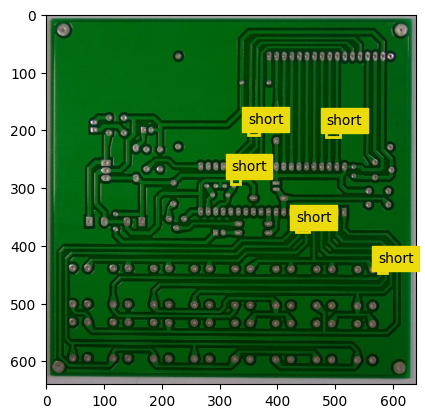


image 1/1 /content/yolo_test_dataset/images/12_short_10.jpg: 640x640 5 shorts, 17.8ms
Speed: 2.5ms preprocess, 17.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


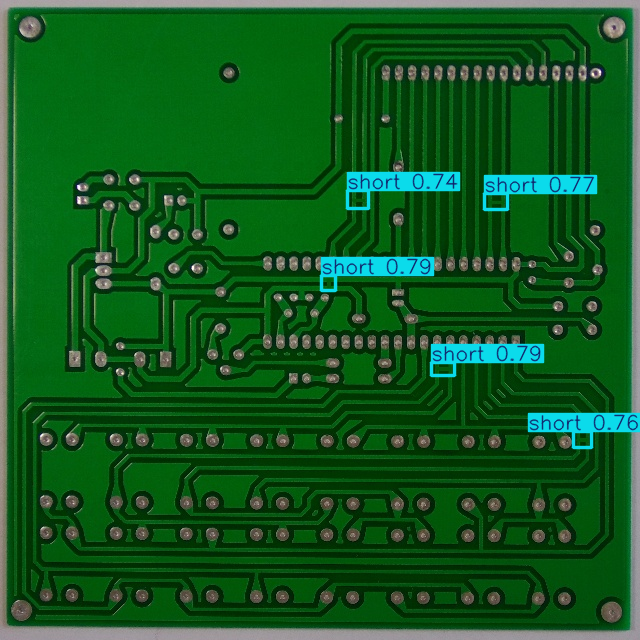

image 1: /content/yolo_test_dataset/images/04_spurious_copper_10.jpg
labelled image: 


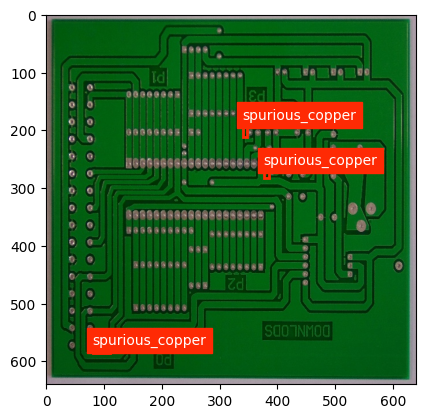


image 1/1 /content/yolo_test_dataset/images/04_spurious_copper_10.jpg: 640x640 3 spurious_coppers, 15.6ms
Speed: 2.6ms preprocess, 15.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


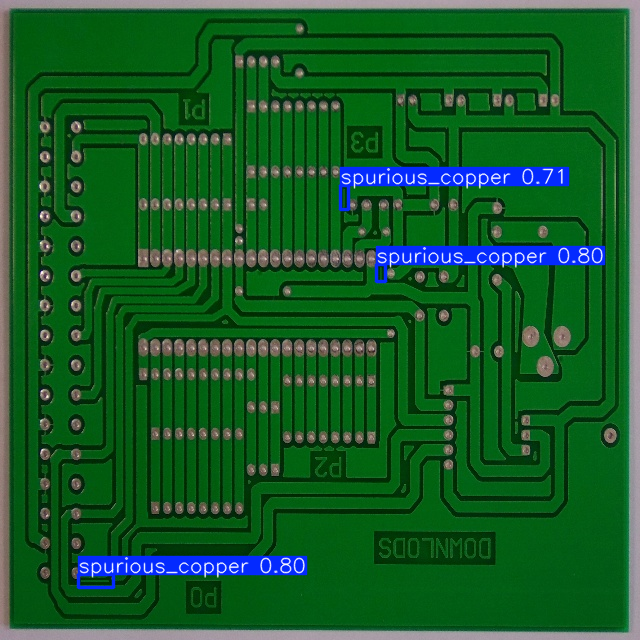

image 2: /content/yolo_test_dataset/images/06_spur_02.jpg
labelled image: 


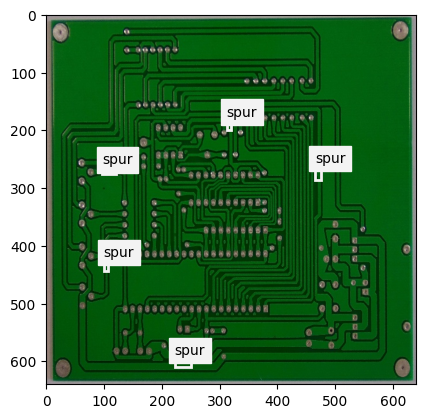


image 1/1 /content/yolo_test_dataset/images/06_spur_02.jpg: 640x640 1 spurious_copper, 5 spurs, 15.6ms
Speed: 2.6ms preprocess, 15.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


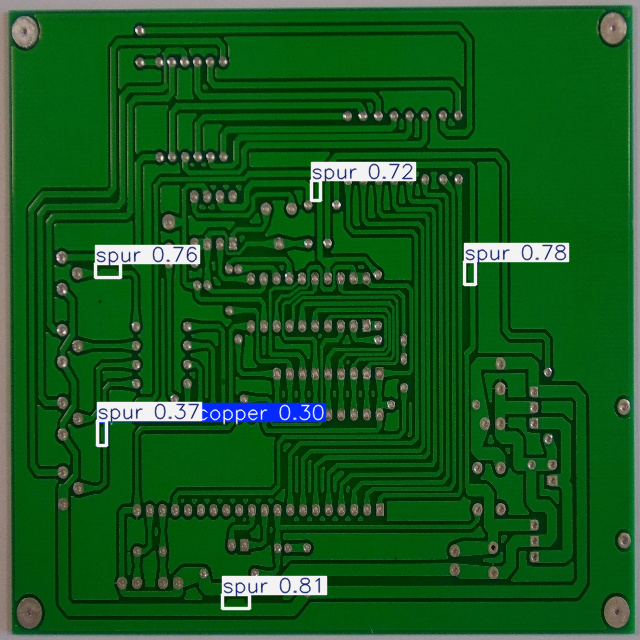

image 3: /content/yolo_test_dataset/images/04_short_18.jpg
labelled image: 


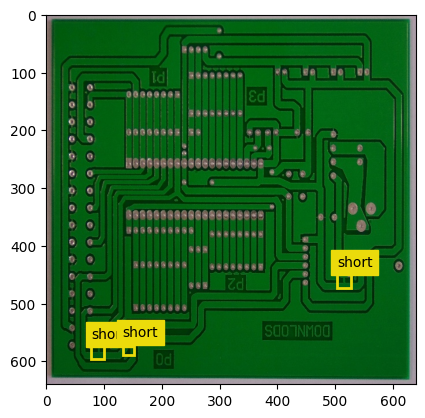


image 1/1 /content/yolo_test_dataset/images/04_short_18.jpg: 640x640 3 shorts, 17.5ms
Speed: 5.1ms preprocess, 17.5ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


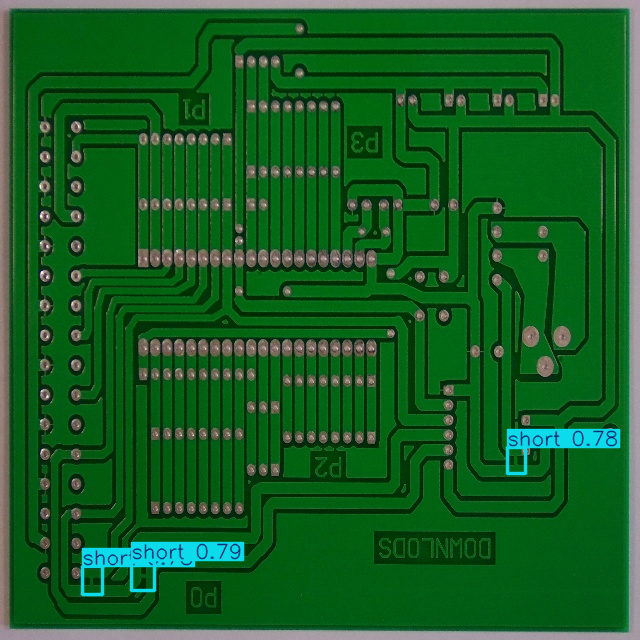

image 4: /content/yolo_test_dataset/images/01_spur_05.jpg
labelled image: 


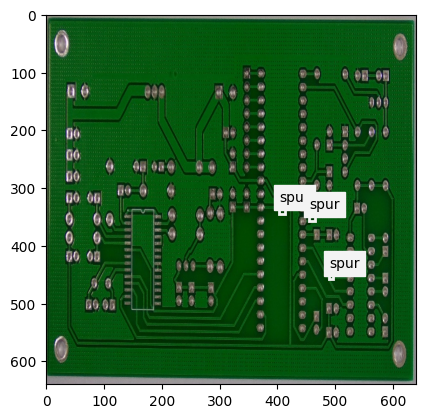


image 1/1 /content/yolo_test_dataset/images/01_spur_05.jpg: 640x640 1 spur, 15.6ms
Speed: 2.6ms preprocess, 15.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


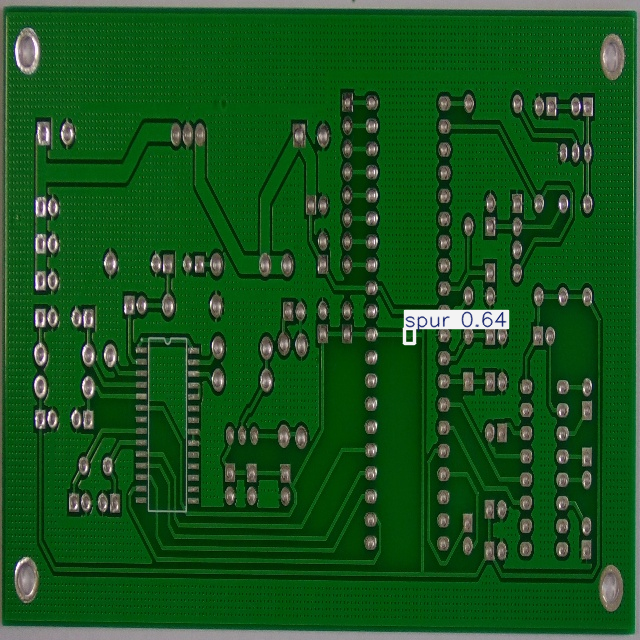

image 5: /content/yolo_test_dataset/images/04_short_18.jpg
labelled image: 


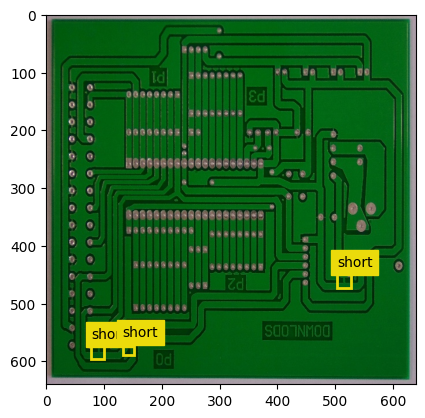


image 1/1 /content/yolo_test_dataset/images/04_short_18.jpg: 640x640 3 shorts, 15.6ms
Speed: 2.6ms preprocess, 15.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


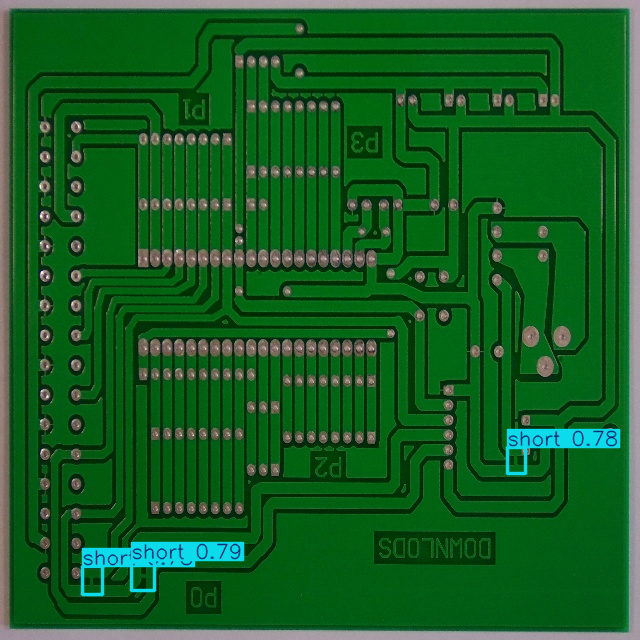

image 6: /content/yolo_test_dataset/images/12_short_03.jpg
labelled image: 


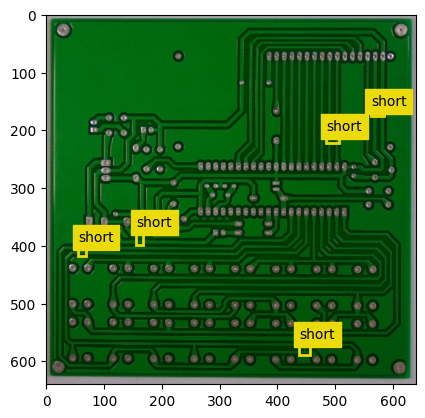


image 1/1 /content/yolo_test_dataset/images/12_short_03.jpg: 640x640 5 shorts, 15.6ms
Speed: 2.7ms preprocess, 15.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


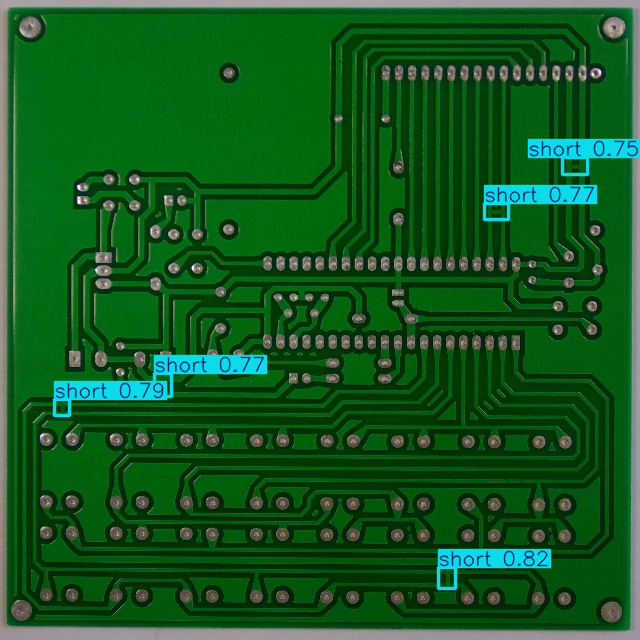

image 7: /content/yolo_test_dataset/images/09_spur_02.jpg
labelled image: 


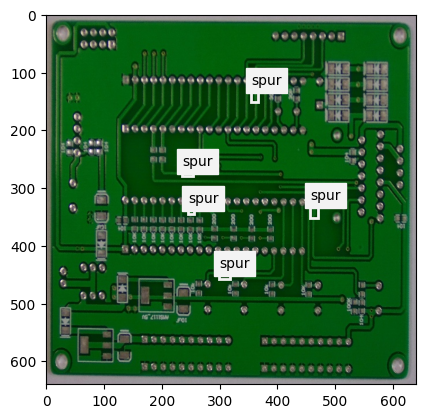


image 1/1 /content/yolo_test_dataset/images/09_spur_02.jpg: 640x640 5 spurs, 15.6ms
Speed: 2.5ms preprocess, 15.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


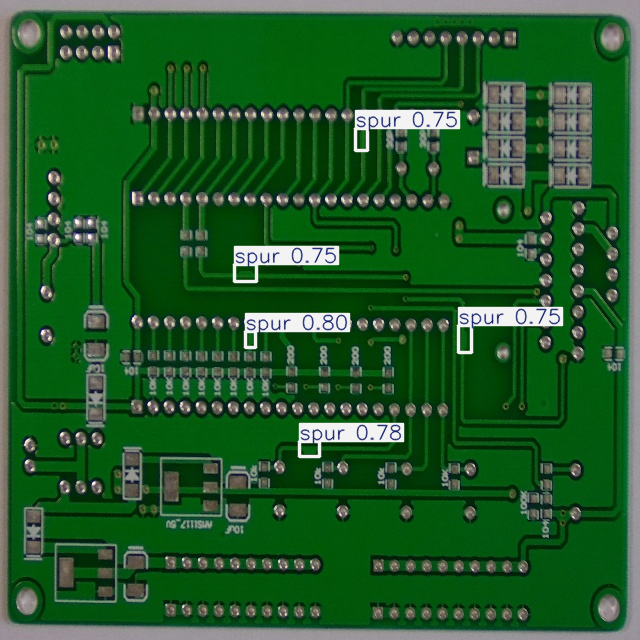

image 8: /content/yolo_test_dataset/images/07_mouse_bite_01.jpg
labelled image: 


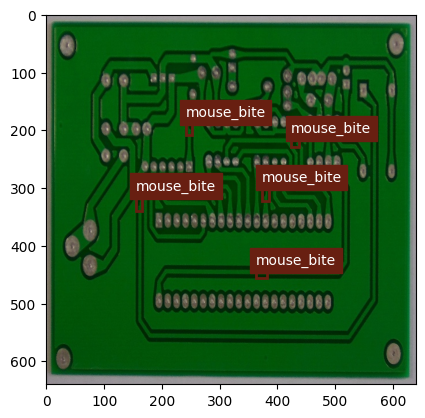


image 1/1 /content/yolo_test_dataset/images/07_mouse_bite_01.jpg: 640x640 5 mouse_bites, 15.6ms
Speed: 2.6ms preprocess, 15.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


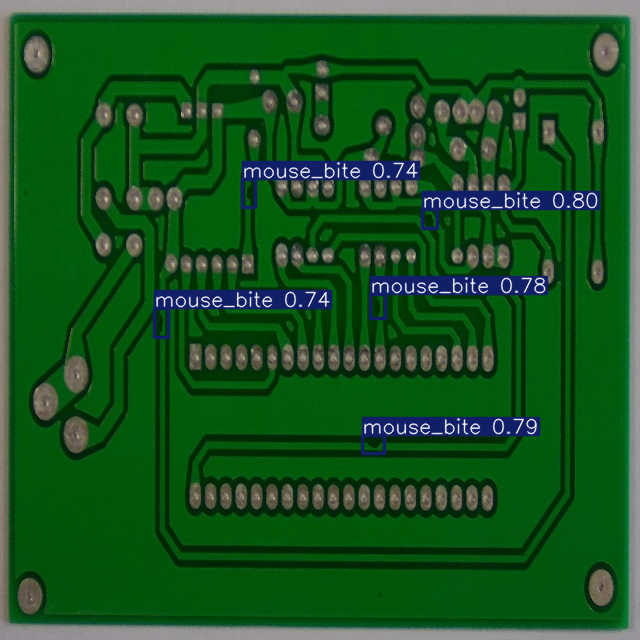

image 9: /content/yolo_test_dataset/images/07_missing_hole_04.jpg
labelled image: 


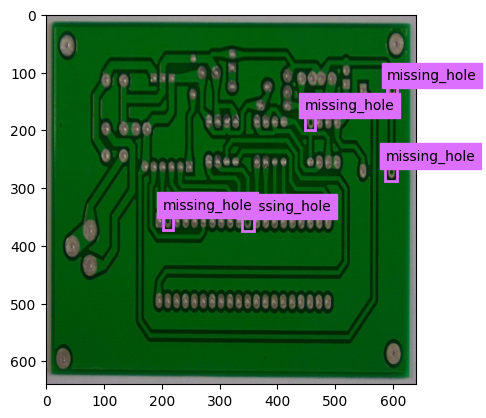


image 1/1 /content/yolo_test_dataset/images/07_missing_hole_04.jpg: 640x640 5 missing_holes, 15.6ms
Speed: 2.8ms preprocess, 15.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
predicted image: 


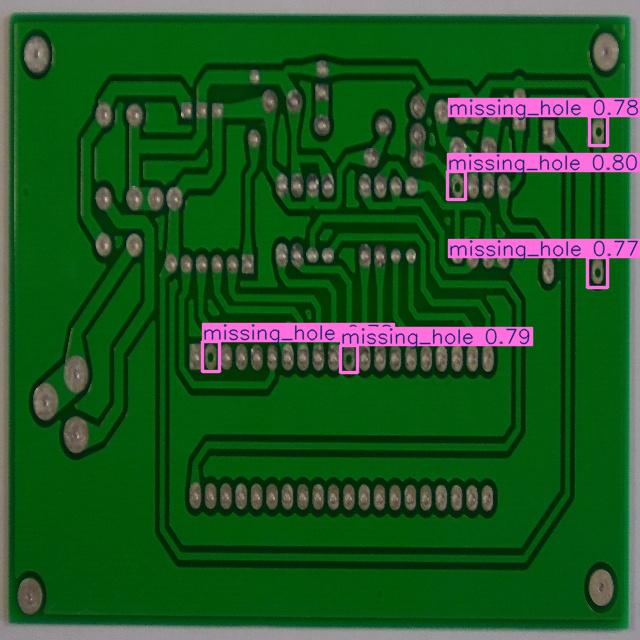

In [ ]:
import random
test_imgs = '/content/yolo_test_dataset/images'
def random_test(model, img_num):
  for i in range(img_num):
    rand_img = os.path.join(test_imgs, random.choice(os.listdir(test_imgs)))
    print('image ' + str(i) + ': ' + rand_img)
    test_model(model, rand_img)
random_test("/content/runs/detect/train4/weights/best.pt", 10)

In [ ]:
!zip -r /content/yolo_model_export.zip /content/runs/detect/train4/

  adding: content/runs/detect/train4/ (stored 0%)
  adding: content/runs/detect/train4/val_batch1_labels.jpg (deflated 19%)
  adding: content/runs/detect/train4/labels_correlogram.jpg (deflated 35%)
  adding: content/runs/detect/train4/train_batch0.jpg (deflated 4%)
  adding: content/runs/detect/train4/train_batch5892.jpg (deflated 8%)
  adding: content/runs/detect/train4/weights/ (stored 0%)
  adding: content/runs/detect/train4/weights/last.pt (deflated 8%)
  adding: content/runs/detect/train4/weights/best.pt (deflated 8%)
  adding: content/runs/detect/train4/BoxF1_curve.png (deflated 9%)
  adding: content/runs/detect/train4/train_batch5891.jpg (deflated 7%)
  adding: content/runs/detect/train4/val_batch1_pred.jpg (deflated 18%)
  adding: content/runs/detect/train4/val_batch2_pred.jpg (deflated 10%)
  adding: content/runs/detect/train4/train_batch5890.jpg (deflated 8%)
  adding: content/runs/detect/train4/confusion_matrix.png (deflated 24%)
  adding: content/runs/detect/train4/train_b

In [ ]:
from google.colab import files
files.download('/content/yolo_model_export.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>